<a href="https://colab.research.google.com/github/hadi-yazdi/courtyard_feature_extraction/blob/main/courtyard_detection_trainig.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount("/gdrive")


Mounted at /gdrive


In [ ]:
!pip install remo
!python -m remo_app init --colab


     |████████████████████████████████| 14.3 MB 5.1 MB/s 
     |████████████████████████████████| 148 kB 69.0 MB/s 
     |████████████████████████████████| 7.5 MB 74.6 MB/s 
     |████████████████████████████████| 911 kB 72.9 MB/s 
     |████████████████████████████████| 53 kB 2.3 MB/s 
     |████████████████████████████████| 3.2 MB 77.8 MB/s 
     |████████████████████████████████| 65 kB 4.5 MB/s 
     |████████████████████████████████| 72 kB 927 kB/s 
     |████████████████████████████████| 448 kB 80.9 MB/s 
     |████████████████████████████████| 69 kB 8.0 MB/s 
     |████████████████████████████████| 57 kB 5.9 MB/s 
     |████████████████████████████████| 545 kB 72.6 MB/s 
     |████████████████████████████████| 133 kB 72.1 MB/s 
     |████████████████████████████████| 58 kB 5.9 MB/s 
  Created wheel for django-allauth: filename=django_allauth-0.41.0-py3-none-any.whl size=855166 sha256=888798f1a82643cbf90deb157d55431377c46386f476790145059d9b75bfa885
  Stored in directory: /root/.ca


    (\(\
    (>':')  Remo: v0.6.1
Python: 3.7.11, Linux-5.4.104+-x86_64-with-Ubuntu-18.04-bionic

Initiailizing Remo:

This will download and install the following packages as needed: 
   * openssl
   * apt-transport-https
   * ca-certificates
   * unzip
   * libpq-dev
   * python3-dev
   * unzip
   * vips
   * postgres
   * supervisor
   * ngrok

Remo Terms of Service: https://remo.ai/docs/terms/

Do you want to continue with the installation of remo? [Y/n]: y
Installing Remo to dir: /gdrive/My Drive/RemoApp

[-] Installing OS specific tools
$ sudo apt-get update -qq
$ sudo apt-get install -y -qq openssl
$ sudo apt-get install -y -qq apt-transport-https ca-certificates unzip libpq-dev python3-dev

Completed - components installed
--------------------------------------------------

[-] Installing vips lib
$ sudo apt-get install -y -qq libvips-dev

Completed - components installed
--------------------------------------------------

[-] Installing postgres
$ sudo apt-get install -y -qq 

In [ ]:
from PIL import Image
import os
import glob
import random
import csv
random.seed(4)

import pandas as pd
import numpy as np
import tqdm

import torch
from torch.utils.data import DataLoader, Dataset

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
import torchvision.transforms as transforms

import tensorflow as tf
from matplotlib import pyplot as plt
import cv2

import remo
remo.set_viewer('jupyter')

In [ ]:
# The path to the folders
path_to_images =  '/gdrive/MyDrive/courtyard/train/'
path_to_annotations = '/gdrive/MyDrive/courtyard/annotation/'

annotations_file_path = os.path.join(path_to_annotations, 'annotations.csv')

In [ ]:
# Mapping between Class name and Index
cat_to_index = {'Yard'         : 1}

In [ ]:
im_list = [os.path.abspath(i) for i in glob.glob(path_to_images + '/**/*.jpg', recursive=True)]
im_list = random.sample(im_list, len(im_list))

# Definining the train test split
train_idx = round(len(im_list) * 0.8)
valid_idx = train_idx + round(len(im_list) * 0.2)
test_idx  = valid_idx + round(len(im_list) * 0.0)

# Creating a dictionary with tags
tags_dict =  {'train' : im_list[0:train_idx], 
              'valid' : im_list[train_idx:valid_idx], 
              'test' : im_list[valid_idx:test_idx]}

train_test_split_file_path = os.path.join(path_to_annotations, 'images_tags.csv') 
remo.generate_image_tags(tags_dictionary  = tags_dict, 
                         output_file_path = train_test_split_file_path, 
                         append_path = True)

'/gdrive/MyDrive/courtyard/annotation/images_tags.csv'

In [ ]:
# The annotations.csv is generated in the same path of the sub-folder
object_detection_dataset =  remo.create_dataset(name = 'object-detection-dataset', 
                                                local_files = [path_to_images, path_to_annotations],
                                                annotation_task = 'Object Detection')

Acquiring data - completed                                                                           
Processing annotation files: 2 of 2 files                                                            Processing data - completed                                                                          
Data upload completed


In [ ]:
#object_detection_dataset.view()

In [ ]:
object_detection_dataset.get_annotation_statistics()

[{'AnnotationSet ID': 54,
  'AnnotationSet name': 'Object detection',
  'creation_date': None,
  'last_modified_date': '2021-08-09T12:53:39.549775Z',
  'n_classes': 1,
  'n_images': 57,
  'n_objects': 1565,
  'top_3_classes': [{'count': 1565, 'name': 'Yard'}]}]

In [ ]:
#object_detection_dataset.view_annotation_stats()

In [ ]:
class ObjectDetectionDataset(Dataset):
    """
    Custom PyTorch Dataset Class to facilitate loading data for the Object Detection Task
    """
    def __init__(self, 
                 annotations, 
                 train_test_valid_split, 
                 mapping = None, 
                 mode = 'train', 
                 transform = None): 
        """ 
        Args:
            annotations: The path to the annotations CSV file. Format: file_name, classes, xmin, ymin, xmax, ymax
            train_test_valid_split: The path to the tags CSV file for train, test, valid split. Format: file_name, tag
            mapping: a dictionary containing mapping of class name and class index. Format : {'class_name' : 'class_index'}, Default: None
            mode: Mode in which to instantiate class. Default: 'train'
            transform: The transforms to be applied to the image data

        Returns:
            image : Torch Tensor, target: Torch Tensor, file_name : str
        """
        self.mapping = mapping
        self.transform = transform
        self.mode = mode

        self.path_to_images = '/gdrive/MyDrive/courtyard/train/'
        # Loading the annotation file (same format as Remo's)
        my_data = pd.read_csv(annotations)
        # Here we append the file path to the filename. 
        # If dataset.export_annotations_to_file was used to create the annotation file, it would feature by default image file paths
        my_data['file_name'] = my_data['file_name'].apply(lambda x : os.path.abspath(f'{self.path_to_images}{x}'))
        my_data = my_data.set_index('file_name')

        # Loading the train/test split file (same format as Remo's)
        my_data['tag'] = pd.read_csv(train_test_valid_split, index_col='file_name')

        my_data = my_data.reset_index()
        # Load only Train/Test/Split depending on the mode
        my_data = my_data.loc[my_data['tag'] == mode].reset_index(drop=True)
        self.data = my_data

        self.file_names = self.data['file_name'].unique()

    def __len__(self) -> int:
        return self.file_names.shape[0]

    def __getitem__(self, index: int):

        file_name = self.file_names[index]
        records = self.data[self.data['file_name'] == file_name].reset_index()       
        image = np.array(Image.open(file_name), dtype=np.float32)
        image /= 255.0

        if self.transform:
            image = self.transform(image)  

        # here we are assuming we don't have labels for the test set
        if self.mode != 'test':
            boxes = records[['xmin', 'ymin', 'xmax', 'ymax']].values
            area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
            area = torch.as_tensor(area, dtype=torch.float32)

            if self.mapping is not None:
                labels = np.zeros((records.shape[0],))

                for i in range(records.shape[0]):
                    labels[i] = self.mapping[records.loc[i, 'classes']]

                labels = torch.as_tensor(labels, dtype=torch.int64)

            else:
                labels = torch.ones((records.shape[0],), dtype=torch.int64)

            iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)

            target = {}
            target['boxes'] = boxes
            target['labels'] = labels
            target['image_id'] = torch.tensor([index])
            target['area'] = area
            target['iscrowd'] = iscrowd 
            target['boxes'] = torch.stack(list((map(torch.tensor, target['boxes'])))).type(torch.float32)

            return image, target, file_name
        else:
            return image, file_name

def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
tensor_transform = transforms.Compose([transforms.ToTensor()])

# Here the operations provided with Remo are integrated into a workflow in PyTorch 
# by using the custom ObjectDetectionDataset method.

train_dataset = ObjectDetectionDataset(annotations = annotations_file_path,  
                                       train_test_valid_split = train_test_split_file_path,
                                       transform = tensor_transform,
                                       mapping = cat_to_index,
                                       mode = 'train')

test_dataset = ObjectDetectionDataset(annotations = annotations_file_path,  
                                       train_test_valid_split = train_test_split_file_path,
                                       transform = tensor_transform,
                                       mapping = cat_to_index,
                                       mode = 'test')


train_data_loader = DataLoader(train_dataset, batch_size=1, shuffle=False, num_workers=0, collate_fn=collate_fn)
test_data_loader  = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0, collate_fn=collate_fn)



In [ ]:
device      = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
num_classes = 2
loss_value  = 0.0
num_epochs  = 50

In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

model.to(device)

params = [p for p in model.parameters() if p.requires_grad]

optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

In [ ]:
# The training loop trains the model for the total number of epochs.
# (1 epoch = one complete pass over the entire dataset)

for epoch in range(num_epochs):

    train_data_loader = tqdm.tqdm(train_data_loader)
    for images, targets, image_ids in train_data_loader:

        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step() 
    print('\nTraining Loss : {:.5f}'.format(loss_value))

  2%|▏         | 1/46 [00:00<00:07,  5.83it/s]


Training Loss : 0.86618


  2%|▏         | 1/46 [00:00<00:07,  6.00it/s]


Training Loss : 0.76611


  2%|▏         | 1/46 [00:00<00:07,  5.95it/s]


Training Loss : 0.50185


  2%|▏         | 1/46 [00:00<00:07,  5.96it/s]


Training Loss : 0.45020


  2%|▏         | 1/46 [00:00<00:07,  5.99it/s]


Training Loss : 0.52337


  2%|▏         | 1/46 [00:00<00:07,  6.05it/s]


Training Loss : 0.38104


  2%|▏         | 1/46 [00:00<00:07,  5.89it/s]


Training Loss : 0.42947


  2%|▏         | 1/46 [00:00<00:07,  5.84it/s]


Training Loss : 0.31465


  2%|▏         | 1/46 [00:00<00:07,  5.82it/s]


Training Loss : 0.32450


  2%|▏         | 1/46 [00:00<00:07,  5.97it/s]


Training Loss : 0.28236


  2%|▏         | 1/46 [00:00<00:07,  5.91it/s]


Training Loss : 0.31690


  2%|▏         | 1/46 [00:00<00:07,  5.97it/s]


Training Loss : 0.28730


  2%|▏         | 1/46 [00:00<00:07,  6.04it/s]


Training Loss : 0.39152


  2%|▏         | 1/46 [00:00<00:07,  6.05it/s]


Training Loss : 0.32346


  2%|▏         | 1/46 [00:00<00:07,  6.02it/s]


Training Loss : 0.28926


  2%|▏         | 1/46 [00:00<00:07,  5.86it/s]


Training Loss : 0.22961


  2%|▏         | 1/46 [00:00<00:07,  5.93it/s]


Training Loss : 0.23183


  2%|▏         | 1/46 [00:00<00:07,  6.12it/s]


Training Loss : 0.20994


  2%|▏         | 1/46 [00:00<00:07,  6.07it/s]


Training Loss : 0.23571


  2%|▏         | 1/46 [00:00<00:07,  6.12it/s]


Training Loss : 0.22670


  2%|▏         | 1/46 [00:00<00:07,  6.08it/s]


Training Loss : 0.23297


  2%|▏         | 1/46 [00:00<00:07,  5.92it/s]


Training Loss : 0.33317


  2%|▏         | 1/46 [00:00<00:07,  5.91it/s]


Training Loss : 0.31739


  2%|▏         | 1/46 [00:00<00:07,  5.91it/s]


Training Loss : 0.28922


  2%|▏         | 1/46 [00:00<00:07,  5.95it/s]


Training Loss : 0.19999


  2%|▏         | 1/46 [00:00<00:07,  5.96it/s]


Training Loss : 0.17138


  2%|▏         | 1/46 [00:00<00:07,  6.03it/s]


Training Loss : 0.14213


  2%|▏         | 1/46 [00:00<00:07,  6.13it/s]


Training Loss : 0.15054


  2%|▏         | 1/46 [00:00<00:07,  6.03it/s]


Training Loss : 0.20936


  2%|▏         | 1/46 [00:00<00:07,  5.83it/s]


Training Loss : 0.19178


  2%|▏         | 1/46 [00:00<00:07,  6.00it/s]


Training Loss : 0.19069


  2%|▏         | 1/46 [00:00<00:07,  5.68it/s]


Training Loss : 0.14144


  2%|▏         | 1/46 [00:00<00:07,  5.88it/s]


Training Loss : 0.13541


  2%|▏         | 1/46 [00:00<00:07,  6.03it/s]


Training Loss : 0.15256


  2%|▏         | 1/46 [00:00<00:07,  6.09it/s]


Training Loss : 0.15650


  2%|▏         | 1/46 [00:00<00:07,  6.14it/s]


Training Loss : 0.20330


  2%|▏         | 1/46 [00:00<00:07,  6.15it/s]


Training Loss : 0.17894


  2%|▏         | 1/46 [00:00<00:07,  6.14it/s]


Training Loss : 0.16744


  2%|▏         | 1/46 [00:00<00:07,  5.76it/s]


Training Loss : 0.14773


  2%|▏         | 1/46 [00:00<00:07,  5.71it/s]


Training Loss : 0.22169


  2%|▏         | 1/46 [00:00<00:07,  5.63it/s]


Training Loss : 0.16373


  2%|▏         | 1/46 [00:00<00:07,  5.95it/s]


Training Loss : 0.21921


  2%|▏         | 1/46 [00:00<00:07,  6.10it/s]


Training Loss : 0.27774


  2%|▏         | 1/46 [00:00<00:07,  6.21it/s]


Training Loss : 0.22758


  2%|▏         | 1/46 [00:00<00:07,  5.96it/s]


Training Loss : 0.21412


  2%|▏         | 1/46 [00:00<00:07,  6.04it/s]


Training Loss : 0.23215


  2%|▏         | 1/46 [00:00<00:07,  5.67it/s]


Training Loss : 0.19395


  2%|▏         | 1/46 [00:00<00:07,  5.75it/s]


Training Loss : 0.14984


  2%|▏         | 1/46 [00:00<00:07,  6.09it/s]


Training Loss : 0.19066


100%|██████████| 46/46 [00:09<00:00,  4.93it/s]


Training Loss : 0.22579


In [ ]:
# Mapping Between Predicted Index and Class Name
mapping = { value : key for (key, value) in cat_to_index.items()}

detection_threshold = 0.7
results = []

model.eval()
test_data_loader = tqdm.tqdm(test_data_loader)

with torch.no_grad():
    for images, image_ids in test_data_loader:

        images = list(image.to(device) for image in images)
        outputs = model(images)

        for i, image in enumerate(images):

            boxes = outputs[i]['boxes'].data.cpu().numpy()
            scores = outputs[i]['scores'].data.cpu().numpy()
            boxes = boxes[scores >= detection_threshold].astype(np.int32)
            scores = scores[scores >= detection_threshold]
            image_id = image_ids[i]

            for box, labels in zip(boxes, outputs[i]['labels']):
                results.append({'file_name' : os.path.basename(image_id), 
                                'classes'   : mapping[labels.item()], 
                                'xmin'      : box[0],
                                'ymin'      : box[1],
                                'xmax'      : box[2],
                                'ymax'      : box[3]})

model_predictions_path = path_to_annotations + 'model_predictions.csv'

with open(model_predictions_path, 'w') as csvfile:
    writer = csv.DictWriter(csvfile, fieldnames=['file_name', 'classes', 'xmin', 'ymin', 'xmax', 'ymax'])
    writer.writeheader()
    writer.writerows(results)

0it [00:00, ?it/s]


In [ ]:
predictions = object_detection_dataset.create_annotation_set(annotation_task='Object Detection', 
                                                             name = 'model-predictions-oid',
                                                             paths_to_files = [train_test_split_file_path, model_predictions_path])

Exception: ignored

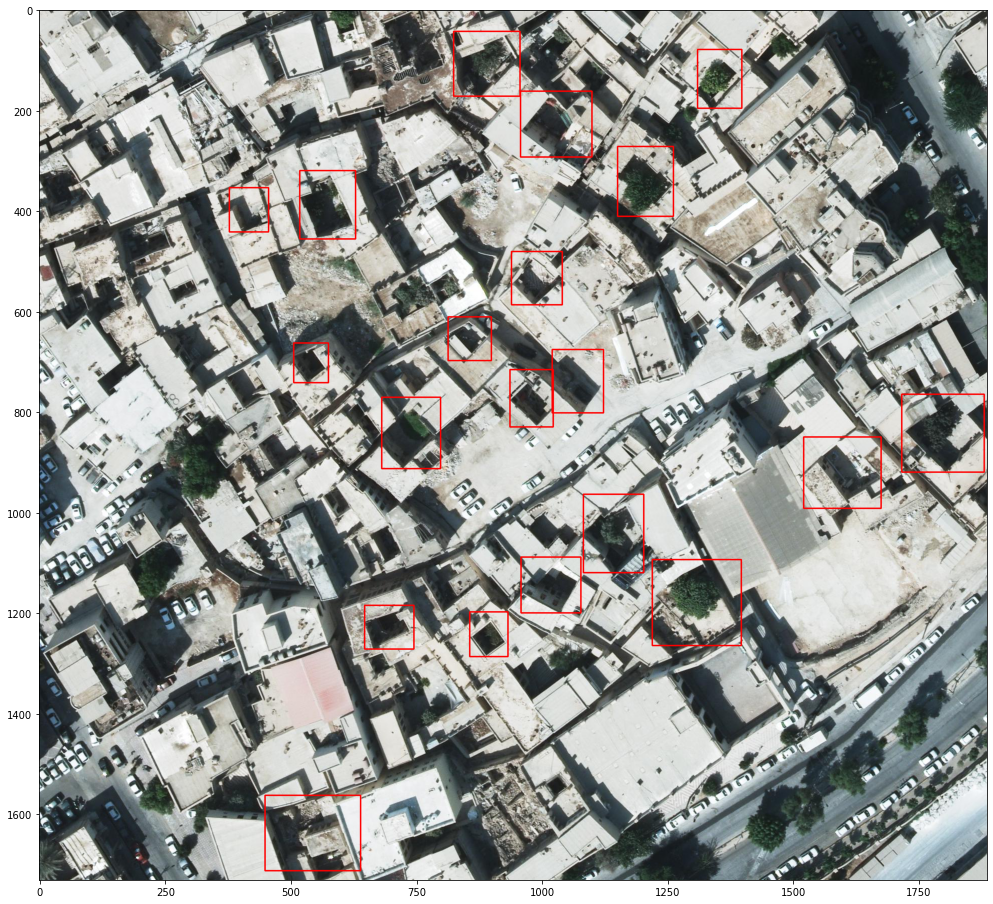

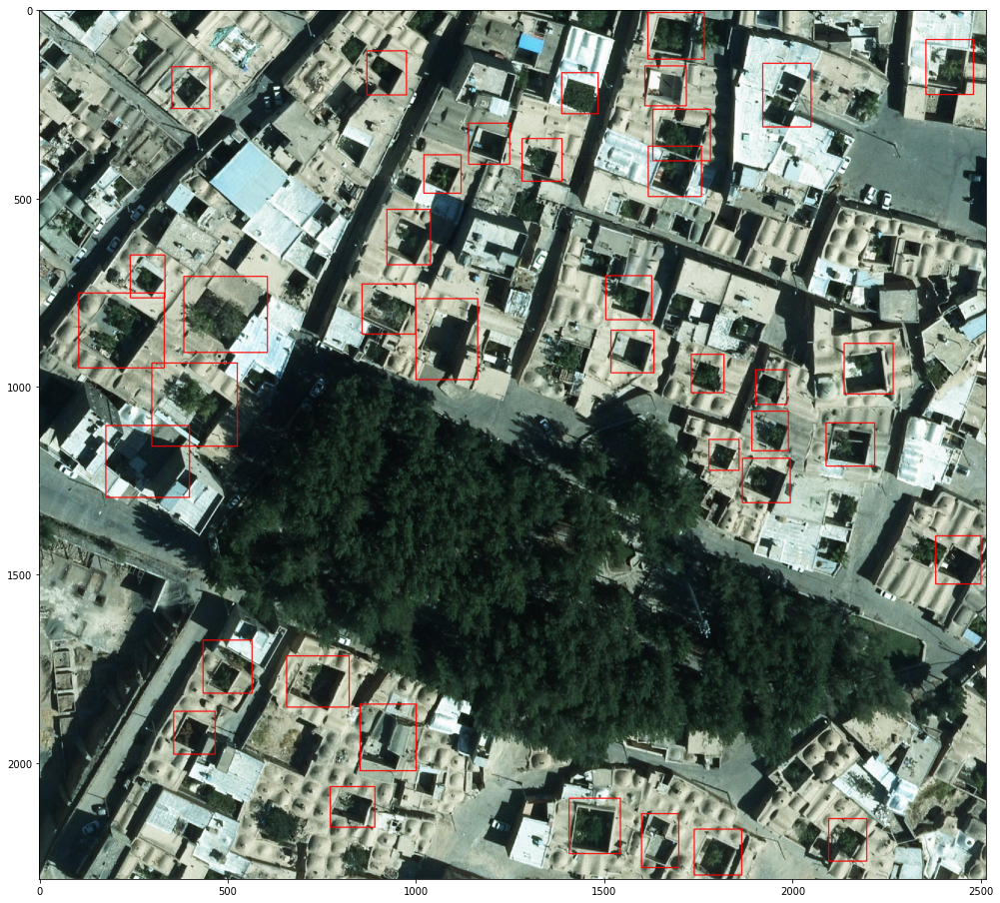

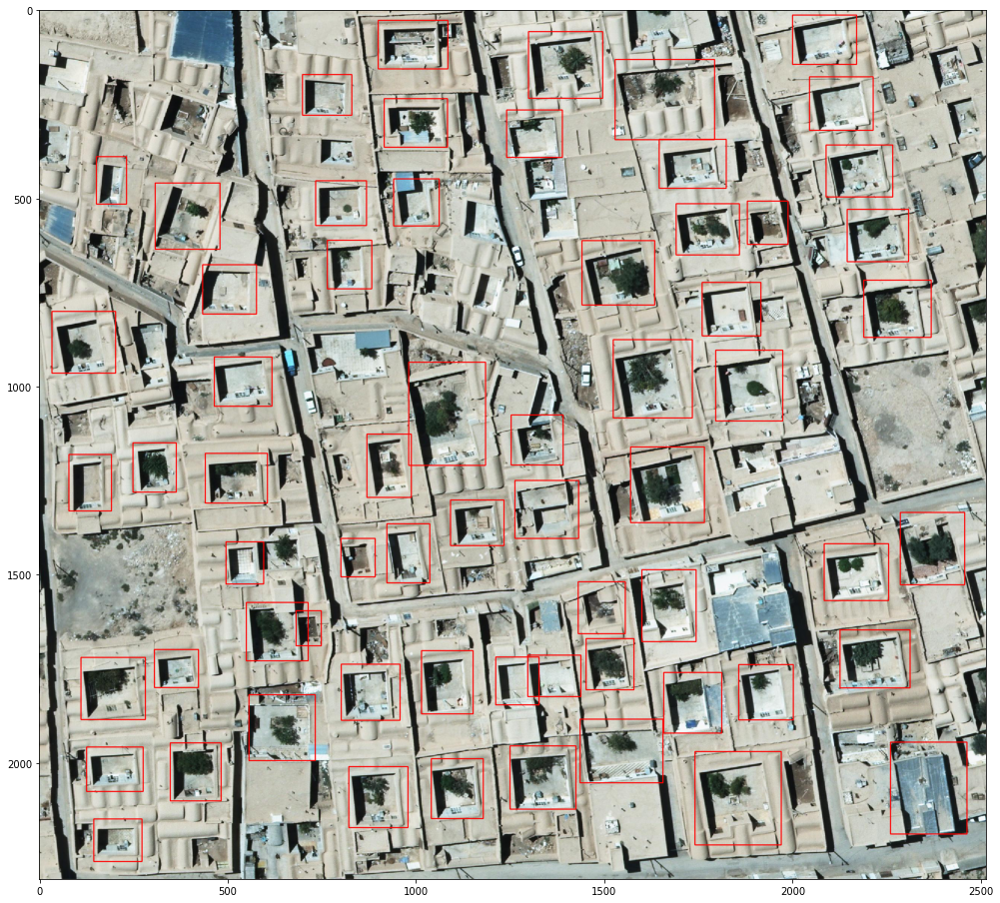

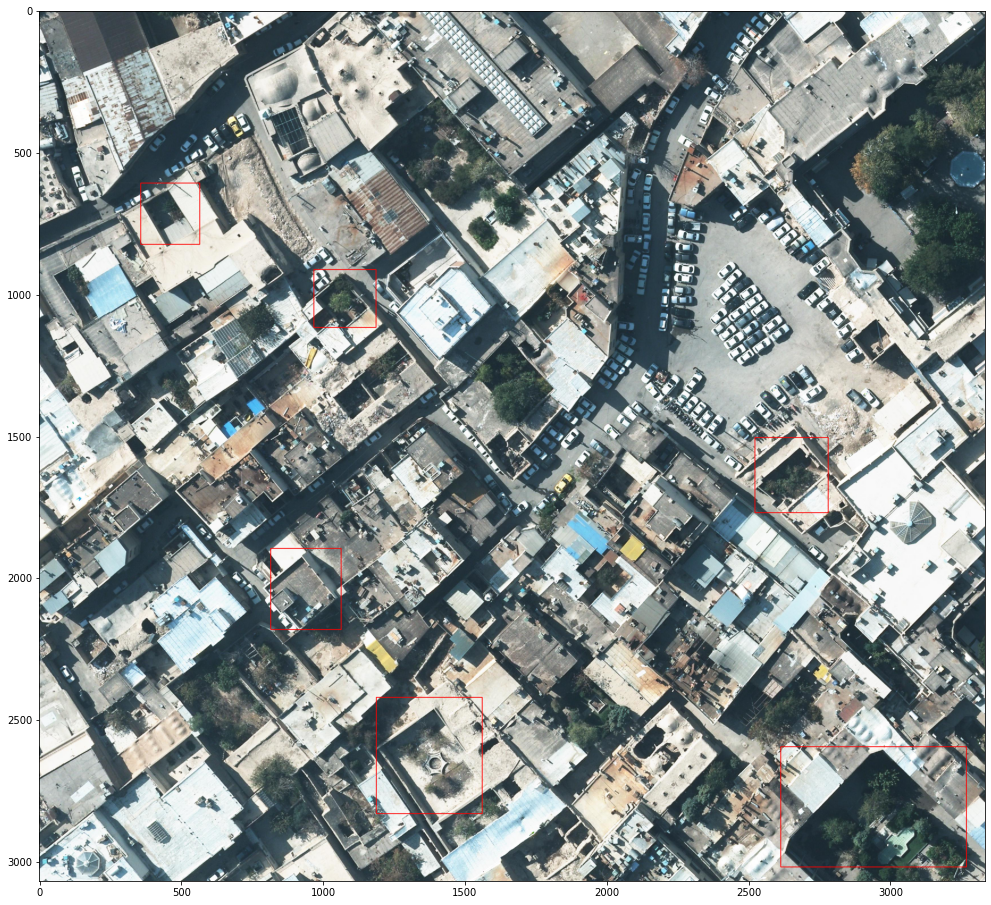

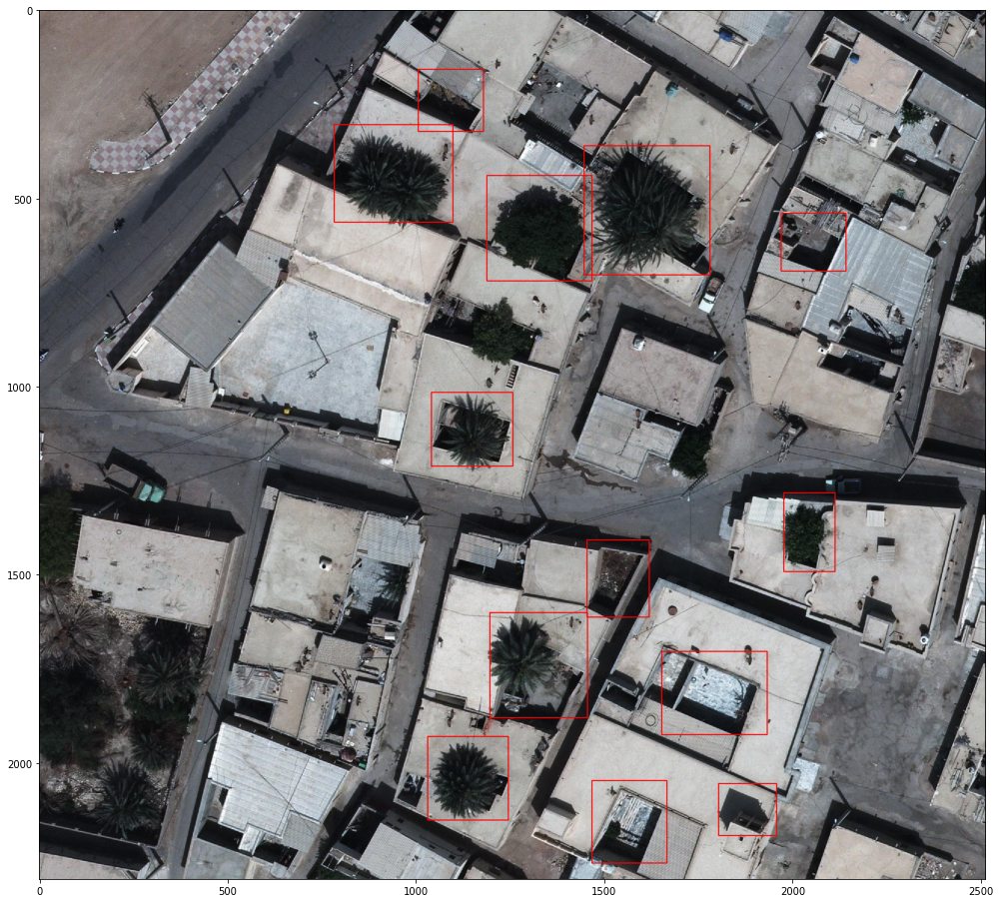

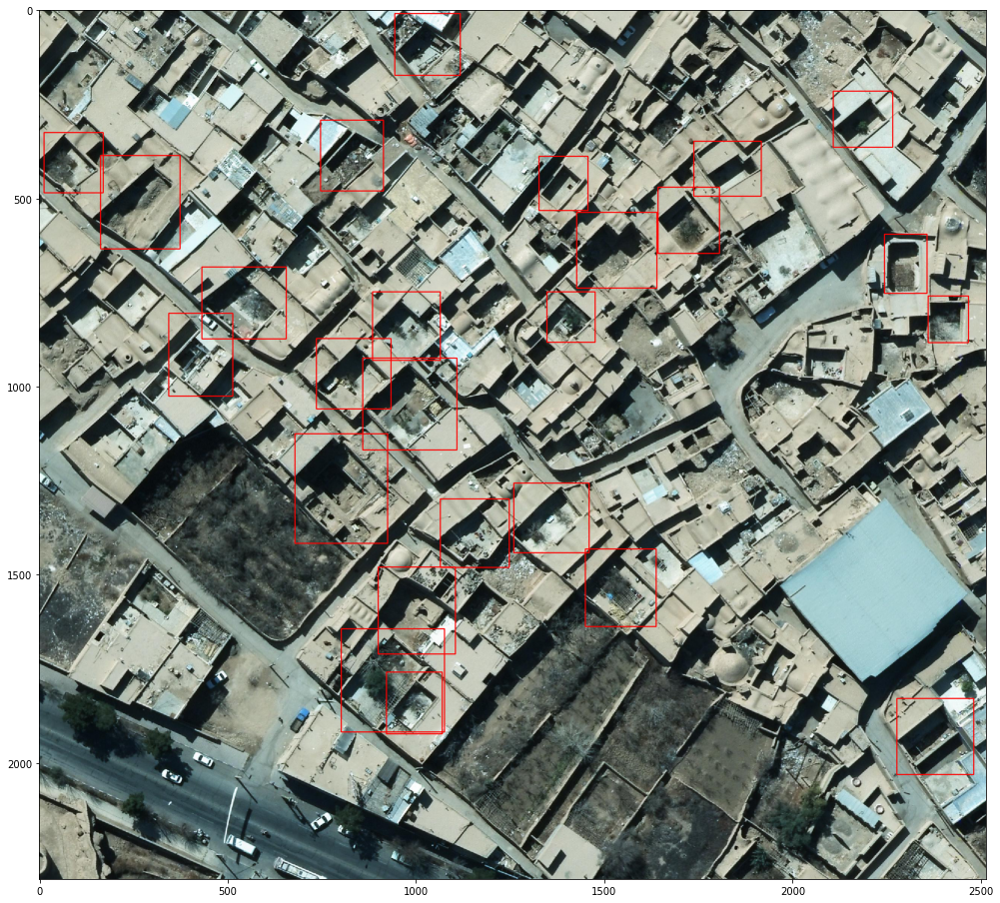

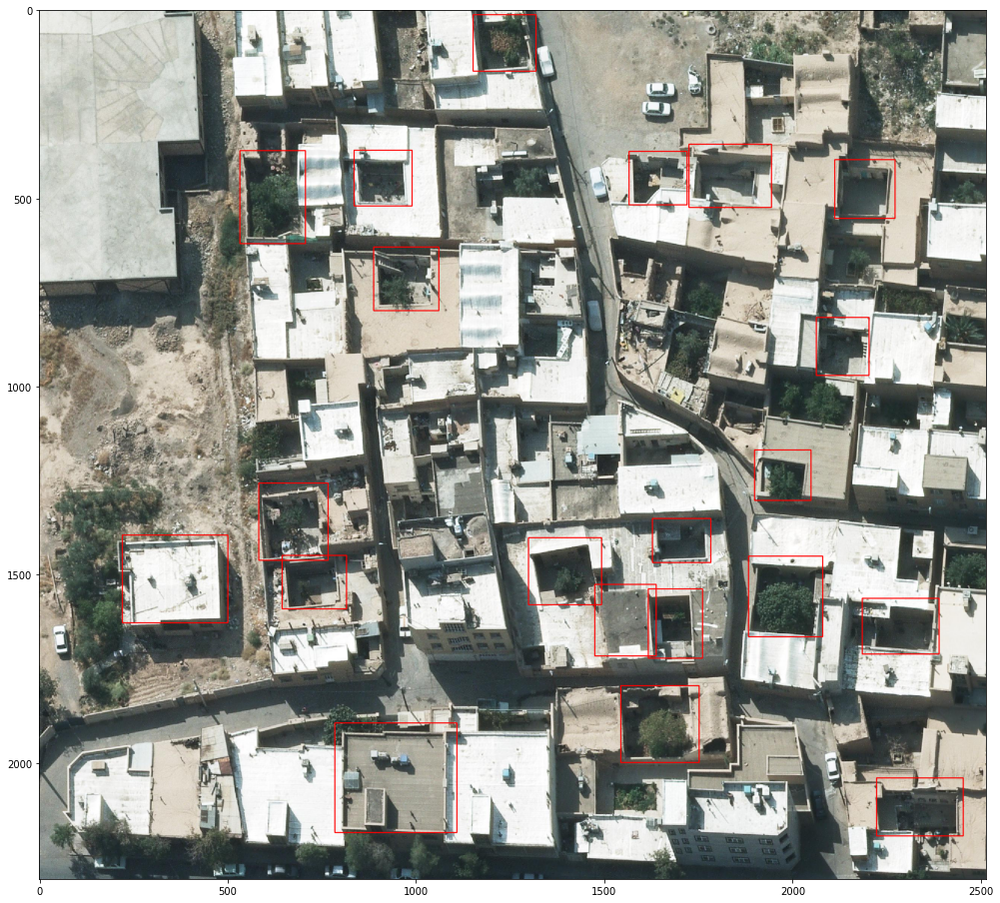

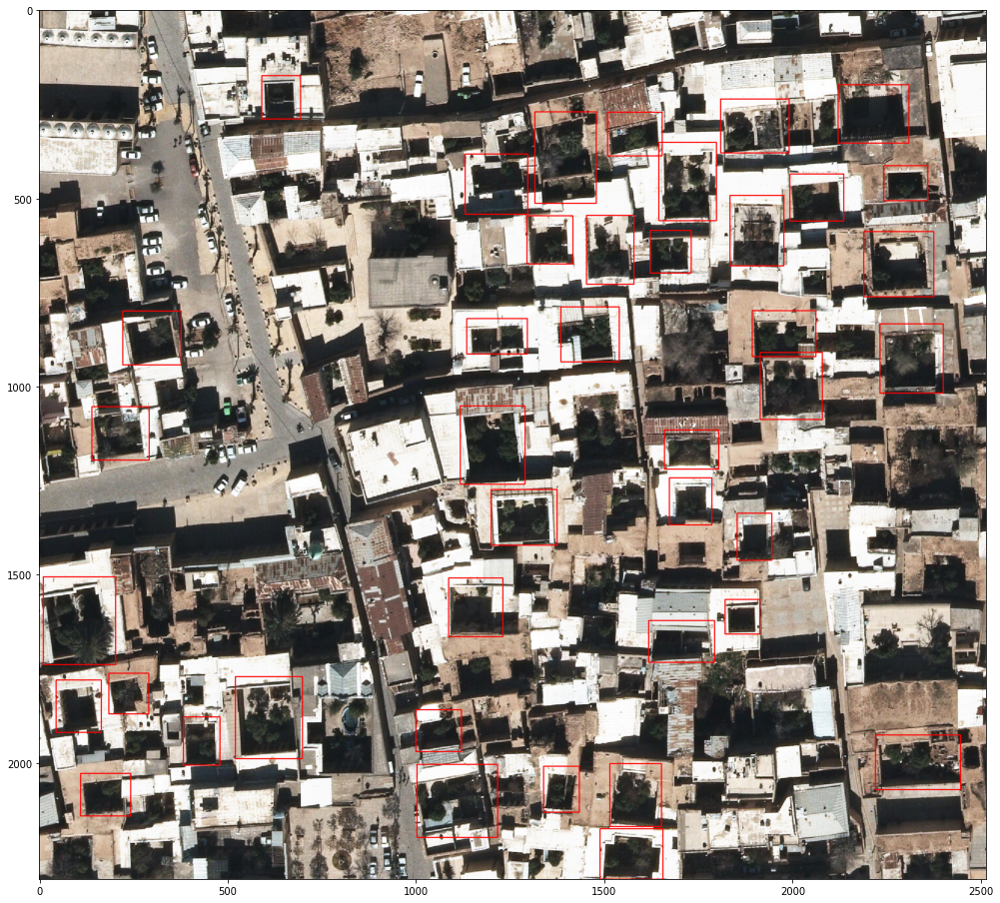

In [ ]:
path = "/gdrive/MyDrive/courtyard/test/"
file_name = os.listdir("/gdrive/MyDrive/courtyard/test/")

for fn in file_name:
  test_image = Image.open(path + fn)

  transform = transforms.Compose([transforms.ToTensor()])

  img_tensor = transform(test_image)
  images = img_tensor.unsqueeze_(0)

  model.eval()
  images = list(image.to(device) for image in images)
  predictions = model(images)

  boxes = predictions[0]['boxes'].data.cpu().numpy()

  img_ar = np.asarray(test_image)
  for i in range(len(boxes)):
    xmin = int(boxes[i][0])
    ymin = int(boxes[i][1])
    xmax = int(boxes[i][2])
    ymax = int(boxes[i][3])

    img_detect = cv2.rectangle(img_ar, (xmin, ymin) , (xmax, ymax), (255, 0, 0), 2)
    img_detect = Image.fromarray(img_detect)
      
  plt.figure(figsize=(20,16))
  plt.imshow(img_detect)

In [ ]:
from google.colab import files

torch.save(model.state_dict(), 'checkpoint_50_225_final.pth')

# download checkpoint file
#files.download('checkpoint_100_100_final.pth')

In [ ]:
object_detection_dataset.view()

Open https://84b678e1477a.ngrok.io/datasets/43
